<a href="https://colab.research.google.com/github/yubin8773/2021-deep-learning/blob/main/keras_5_210728.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
# 간단한 컨브넷 만들기
from tensorflow.keras import layers
from tensorflow.keras import models

model = models.Sequential()
model.add(layers.Conv2D(32, (3,3), activation='relu', input_shape=(28,28,1)))
model.add(layers.MaxPooling2D((2,2)))
model.add(layers.Conv2D(64, (3,3), activation='relu'))
model.add(layers.MaxPooling2D(2,2))
model.add(layers.Conv2D(64, (3,3), activation='relu'))

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


컨브넷이 (image_height, image_width, imge_channels) 크기의 입력 텐서를 사용한다는 점이 중요함

(배치 차원은 포함하지 않음)

In [4]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 26, 26, 32)        320       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 13, 13, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 11, 11, 64)        18496     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 5, 5, 64)          0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 3, 3, 64)          36928     
Total params: 55,744
Trainable params: 55,744
Non-trainable params: 0
_________________________________________________________________


In [5]:
# 컨브넷 위에 분류기 추가하기
model.add(layers.Flatten())
model.add(layers.Dense(64, activation='relu'))
model.add(layers.Dense(10, activation='softmax'))

In [6]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 26, 26, 32)        320       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 13, 13, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 11, 11, 64)        18496     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 5, 5, 64)          0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 3, 3, 64)          36928     
_________________________________________________________________
flatten (Flatten)            (None, 576)               0         
_________________________________________________________________
dense (Dense)                (None, 64)                3

(3, 3, 64) 출력이 (576, ) 크기의 벡터로 펼쳐진 후 Dense 층으로 주입됨

In [7]:
# MNIST 이미지에 컨브넷 훈련
from tensorflow.keras.datasets import mnist
from tensorflow.keras.utils import to_categorical

(train_images, train_labels), (test_images, test_labels) = mnist.load_data()

train_images = train_images.reshape((60000, 28, 28, 1))
train_images = train_images.astype('float32')/255

test_images = test_images.reshape((10000, 28, 28, 1))
test_images = test_images.astype('float32')/255

train_labels = to_categorical(train_labels)
test_labels = to_categorical(test_labels)

model.compile(optimizer='rmsprop', 
              loss='categorical_crossentropy',
              metrics=['accuracy'])
model.fit(train_images, train_labels, epochs=5, batch_size=64)

11493376/11490434 [==============================] - 0s 0us/step
Epoch 1/5
938/938 [==============================] - 35s 4ms/step - loss: 0.1734 - accuracy: 0.9463
Epoch 2/5
938/938 [==============================] - 4s 4ms/step - loss: 0.0471 - accuracy: 0.9854
Epoch 3/5
938/938 [==============================] - 4s 4ms/step - loss: 0.0314 - accuracy: 0.9906
Epoch 4/5
938/938 [==============================] - 4s 4ms/step - loss: 0.0246 - accuracy: 0.9922
Epoch 5/5
938/938 [==============================] - 4s 4ms/step - loss: 0.0193 - accuracy: 0.9940


In [8]:
test_loss, test_acc = model.evaluate(test_images, test_labels)

313/313 [==============================] - 1s 3ms/step - loss: 0.0263 - accuracy: 0.9921


In [9]:
test_acc

0.9921000003814697

In [10]:
model_no_max_pool = models.Sequential()
model_no_max_pool.add(layers.Conv2D(32, (3,3), activation='relu',
                                    input_shape=(28,28,1)))
model_no_max_pool.add(layers.Conv2D(64, (3,3), activation='relu'))
model_no_max_pool.add(layers.Conv2D(64, (3,3), activation='relu'))

In [11]:
model_no_max_pool.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_3 (Conv2D)            (None, 26, 26, 32)        320       
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 24, 24, 64)        18496     
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 22, 22, 64)        36928     
Total params: 55,744
Trainable params: 55,744
Non-trainable params: 0
_________________________________________________________________


In [12]:
"""
# 훈련, 검증, 테스트 폴더로 이미지 복사하기

import os, shutil

original_dataset_dir = '/content/drive/MyDrive/datasets/cats_and_dogs/train'

base_dir = '/content/drive/MyDrive/datasets/cats_and_dogs_small'
#os.mkdir(base_dir)

train_dir = os.path.join(base_dir, 'train')
#os.mkdir(train_dir)
validation_dir = os.path.join(base_dir, 'validation')
#os.mkdir(validation_dir)
test_dir = os.path.join(base_dir, 'test')
#os.mkdir(test_dir)

train_cats_dir = os.path.join(train_dir, 'cats')
#os.mkdir(train_cats_dir)

train_dogs_dir = os.path.join(train_dir, 'dog')
#os.mkdir(train_dogs_dir)

validation_cats_dir = os.path.join(validation_dir, 'cats')
#os.mkdir(validation_cats_dir)

validation_dogs_dir = os.path.join(validation_dir, 'dogs')
#os.mkdir(validation_dogs_dir)

test_cats_dir = os.path.join(test_dir, 'cats')
#os.mkdir(test_cats_dir)

test_dogs_dir = os.path.join(test_dir, 'dogs')
#os.mkdir(test_dogs_dir)

fnames = ['cat.{}.jpg'.format(i) for i in range(1000)]
for fname in fnames:
  src = os.path.join(original_dataset_dir, fname)
  dst = os.path.join(train_cats_dir, fname)
  shutil.copyfile(src, dst)

fnames = ['cat.{}.jpg'.format(i) for i in range(1000, 1500)]
for fname in fnames:
  src = os.path.join(original_dataset_dir, fname)
  dst = os.path.join(validation_cats_dir, fname)
  shutil.copyfile(src, dst)

fnames = ['cat.{}.jpg'.format(i) for i in range(1500, 2000)]
for fname in fnames:
  src = os.path.join(original_dataset_dir, fname)
  dst = os.path.join(test_cats_dir, fname)
  shutil.copyfile(src, dst)

fnames = ['dog.{}.jpg'.format(i) for i in range(1000)]
for fname in fnames:
  src = os.path.join(original_dataset_dir, fname)
  dst = os.path.join(train_dogs_dir, fname)
  shutil.copyfile(src, dst)

fnames = ['dog.{}.jpg'.format(i) for i in range(1000, 1500)]
for fname in fnames:
  src = os.path.join(original_dataset_dir, fname)
  dst = os.path.join(validation_dogs_dir, fname)
  shutil.copyfile(src, dst)

fnames = ['dog.{}.jpg'.format(i) for i in range(1500, 2000)]
for fname in fnames:
  src = os.path.join(original_dataset_dir, fname)
  dst = os.path.join(test_dogs_dir, fname)
  shutil.copyfile(src, dst)

"""

"\n# 훈련, 검증, 테스트 폴더로 이미지 복사하기\n\nimport os, shutil\n\noriginal_dataset_dir = '/content/drive/MyDrive/datasets/cats_and_dogs/train'\n\nbase_dir = '/content/drive/MyDrive/datasets/cats_and_dogs_small'\n#os.mkdir(base_dir)\n\ntrain_dir = os.path.join(base_dir, 'train')\n#os.mkdir(train_dir)\nvalidation_dir = os.path.join(base_dir, 'validation')\n#os.mkdir(validation_dir)\ntest_dir = os.path.join(base_dir, 'test')\n#os.mkdir(test_dir)\n\ntrain_cats_dir = os.path.join(train_dir, 'cats')\n#os.mkdir(train_cats_dir)\n\ntrain_dogs_dir = os.path.join(train_dir, 'dog')\n#os.mkdir(train_dogs_dir)\n\nvalidation_cats_dir = os.path.join(validation_dir, 'cats')\n#os.mkdir(validation_cats_dir)\n\nvalidation_dogs_dir = os.path.join(validation_dir, 'dogs')\n#os.mkdir(validation_dogs_dir)\n\ntest_cats_dir = os.path.join(test_dir, 'cats')\n#os.mkdir(test_cats_dir)\n\ntest_dogs_dir = os.path.join(test_dir, 'dogs')\n#os.mkdir(test_dogs_dir)\n\nfnames = ['cat.{}.jpg'.format(i) for i in range(1000)]\nfor fname

In [13]:
import os, shutil

original_dataset_dir = '/content/drive/MyDrive/datasets/cats_and_dogs/train'

base_dir = '/content/drive/MyDrive/datasets/cats_and_dogs_small'

train_dir = os.path.join(base_dir, 'train')
#os.mkdir(train_dir)
validation_dir = os.path.join(base_dir, 'validation')
#os.mkdir(validation_dir)
test_dir = os.path.join(base_dir, 'test')
#os.mkdir(test_dir)

train_cats_dir = os.path.join(train_dir, 'cats')
#os.mkdir(train_cats_dir)

train_dogs_dir = os.path.join(train_dir, 'dog')
#os.mkdir(train_dogs_dir)

validation_cats_dir = os.path.join(validation_dir, 'cats')
#os.mkdir(validation_cats_dir)

validation_dogs_dir = os.path.join(validation_dir, 'dogs')
#os.mkdir(validation_dogs_dir)

In [14]:
print('훈련용 고양이 이미지 전체 개수:', len(os.listdir(train_cats_dir)))

훈련용 고양이 이미지 전체 개수: 1000


In [15]:
# 강아지 vs 고양이 분류를 위한 소규모 컨브넷 만들기
from tensorflow.keras import layers
from tensorflow.keras import models

model = models.Sequential()
model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(150, 150, 3)))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Flatten())
model.add(layers.Dense(512, activation='relu'))
model.add(layers.Dense(1, activation='sigmoid'))

In [16]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_6 (Conv2D)            (None, 148, 148, 32)      896       
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 74, 74, 32)        0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 72, 72, 64)        18496     
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 36, 36, 64)        0         
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 34, 34, 128)       73856     
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 17, 17, 128)       0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 36992)            

In [17]:
# 모델의 훈련 설정하기
from tensorflow.keras import optimizers

model.compile(loss='binary_crossentropy',
              optimizer=optimizers.RMSprop(lr=1e-4),
              metrics=['acc'])

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/optimizer_v2/optimizer_v2.py:375: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


In [18]:
# ImagedataGenerator를 사용하여 디렉터리에서 이미지 읽기
from keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(150, 150),
    batch_size=20,
    class_mode='binary')

validation_generator = test_datagen.flow_from_directory(
    validation_dir,
    target_size=(150, 150),
    batch_size=20,
    class_mode='binary')

Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.


In [19]:
for data_batch, labels_batch in train_generator:
  print('배치 데이터 크기:', data_batch.shape)
  print('배치 레이블 크기:', labels_batch.shape)
  break

배치 데이터 크기: (20, 150, 150, 3)
배치 레이블 크기: (20,)


In [20]:
# 배치 제너레이터를 사용하여 모델 훈련하기
history = model.fit_generator(
    train_generator,
    steps_per_epoch=100,
    epochs=30,
    validation_data=validation_generator,
    validation_steps=50)

Epoch 1/30


/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1940: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


100/100 [==============================] - 698s 7s/step - loss: 0.6989 - acc: 0.5515 - val_loss: 0.6588 - val_acc: 0.6090
Epoch 2/30
100/100 [==============================] - 12s 119ms/step - loss: 0.6149 - acc: 0.6595 - val_loss: 0.6037 - val_acc: 0.6770
Epoch 3/30
100/100 [==============================] - 11s 115ms/step - loss: 0.5501 - acc: 0.7215 - val_loss: 0.5671 - val_acc: 0.7020
Epoch 4/30
100/100 [==============================] - 11s 114ms/step - loss: 0.5024 - acc: 0.7535 - val_loss: 0.6343 - val_acc: 0.6640
Epoch 5/30
100/100 [==============================] - 11s 114ms/step - loss: 0.4662 - acc: 0.7840 - val_loss: 0.5766 - val_acc: 0.7000
Epoch 6/30
100/100 [==============================] - 12s 123ms/step - loss: 0.4316 - acc: 0.7985 - val_loss: 0.5482 - val_acc: 0.7170
Epoch 7/30
100/100 [==============================] - 12s 122ms/step - loss: 0.3991 - acc: 0.8285 - val_loss: 0.6117 - val_acc: 0.6800
Epoch 8/30
100/100 [==============================] - 11s 114ms/step

In [21]:
# 모델 저장하기
model.save('cats_and_dogs_small_1.h5')

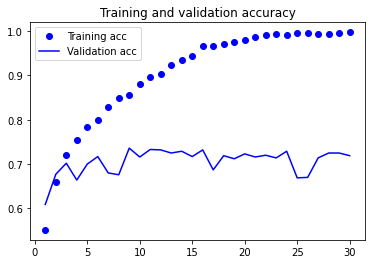

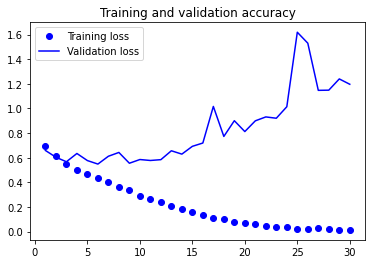

In [22]:
# 훈련의 정확도와 손실 그래프 그리기
import matplotlib.pyplot as plt

acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc)+1)

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation accuracy')
plt.legend()

plt.show()

이 그래프는 과대적합의 특성을 보여줌

비교적 훈련 샘플의 수(2000개)가 적기 때문에 과대적합이 가장 중요한 문제임

In [23]:
# ImageDataGenerator를 사용하여 데이터 증식 설정하기

datagen = ImageDataGenerator(rotation_range= 20,
                             width_shift_range=0.1,
                             height_shift_range=0.1,
                             shear_range=0.1,
                             zoom_range=0.1,
                             horizontal_flip=True,
                             fill_mode='nearest')

- rotaion_rang 랜덤하게 사진을 회전시킬 각도 범위(0~180 사이)
- width_shift_range 와 height_shift_range 사진을 수평과 수직으로 랜덤하게 평행 이동 시킬 범위(전체 넓이와 높이에 대한 비율)
- shear_range 랜덤하게 전단 변환을 적용할 각도 범위 (전단 변환은 rotation_range 로 회전할 때 y축 방향으로 각도를 증가시켜 이미지를 변형시킴)
- zoom_range 랜덤하게 사진을 확대할 범위
- horizontal_flip 랜덤하게 이미지를 수평으로 뒤집음. 수평 대칭을 가정할 수 있을 때 사용
- fill_mode 회전이나 가로/세로 이동으로 인해 새롭게 생성해야 할 픽셀을 채울 전략


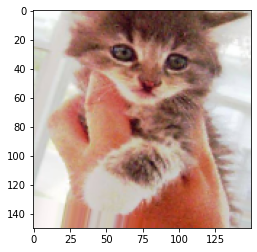

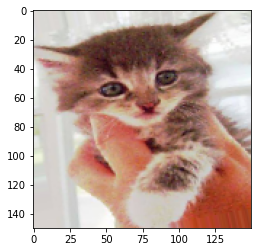

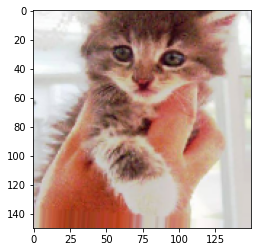

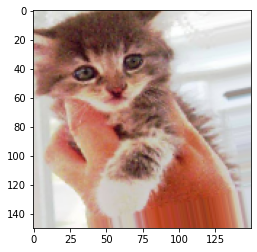

In [24]:
# 랜덤하게 증식된 훈련 이미지 그리기

from tensorflow.keras.preprocessing import image

fnames = sorted([os.path.join(train_cats_dir, fname) for 
                 fname in os.listdir(train_cats_dir)])

img_path = fnames[3]

img = image.load_img(img_path, target_size=(150, 150))

x = image.img_to_array(img)
x = x.reshape((1,) + x.shape)

i = 0
for batch in datagen.flow(x, batch_size=1):
  plt.figure(i)
  imgplot = plt.imshow(image.array_to_img(batch[0]))
  i += 1
  if i % 4 == 0:
    break

plt.show()

데이터 증식을 사용하여 새로운 네트워크를 훈련시킬 때 네트워크에 같은 입력 데이터가 두 번 주입되지 않음

하지만 적은 수의 우너본 이미지에서 만들어졌기 때문에 여전히 입력 데이터들 사이에 상호 연관성이 큼

= 새로운 정보를 만들어낼 수 없고 단지 기존 정보의 재조합만 가능함 -> 완전히 과대적합을 제거하기에 충분하지 않음

과대적합을 더 억제하기 위해 완전 연결 분류기 직전에 Dropout 층을 추가함

(완전 연결 분류기 = 합성곱 층 위에 놓인 완전 연결 층들)

In [25]:
# 드롭아웃을 포함한 새로운 컨브넷 정의하기

model = models.Sequential()
model.add(layers.Conv2D(32, (3, 3), activation='relu',
                        input_shape=(150, 150, 3)))
model.add(layers.MaxPooling2D((2,2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2,2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2,2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2,2)))
model.add(layers.Flatten())
model.add(layers.Dropout(0.5))
model.add(layers.Dense(512, activation='relu'))
model.add(layers.Dense(1, activation='sigmoid'))

model.compile(loss='binary_crossentropy',
              optimizer=optimizers.RMSprop(lr=1e-4),
              metrics=['acc'])


/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/optimizer_v2/optimizer_v2.py:375: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


In [26]:
# 데이터 증식 제너레이터를 사용하여 컨브넷 훈련하기

train_datagen = ImageDataGenerator(rescale=1./255,
                                   rotation_range=40,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   horizontal_flip=True,)

test_dategen = ImageDataGenerator(rescale=1./255) # 검증 데이터와 테스트 데이터는 증식되면 안됨

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(150, 150),
    batch_size=20,
    class_mode='binary')

validation_generator = test_datagen.flow_from_directory(
    validation_dir,
    target_size=(150, 150),
    batch_size=20,
    class_mode='binary')

history = model.fit_generator(
    train_generator,
    steps_per_epoch=100,
    epochs=100,
    validation_data=validation_generator,
    validation_steps=50)

Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.


/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1940: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/100
100/100 [==============================] - 22s 213ms/step - loss: 0.6921 - acc: 0.5165 - val_loss: 0.6806 - val_acc: 0.5150
Epoch 2/100
100/100 [==============================] - 20s 198ms/step - loss: 0.6765 - acc: 0.5475 - val_loss: 0.6888 - val_acc: 0.5360
Epoch 3/100
100/100 [==============================] - 20s 197ms/step - loss: 0.6684 - acc: 0.5715 - val_loss: 0.6511 - val_acc: 0.5910
Epoch 4/100
100/100 [==============================] - 21s 212ms/step - loss: 0.6612 - acc: 0.5870 - val_loss: 0.6362 - val_acc: 0.6240
Epoch 5/100
100/100 [==============================] - 20s 201ms/step - loss: 0.6478 - acc: 0.6095 - val_loss: 0.6232 - val_acc: 0.6460
Epoch 6/100
100/100 [==============================] - 20s 196ms/step - loss: 0.6239 - acc: 0.6460 - val_loss: 0.6067 - val_acc: 0.6670
Epoch 7/100
100/100 [==============================] - 21s 210ms/step - loss: 0.6263 - acc: 0.6480 - val_loss: 0.5942 - val_acc: 0.6790
Epoch 8/100
100/100 [===========================

In [27]:
# 모델 저장하기
model.save('cats_and_dogs_small_2.h5')

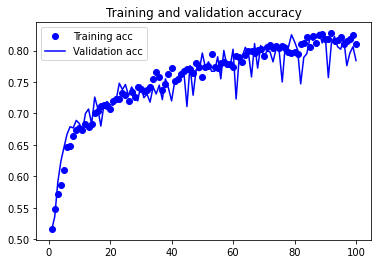

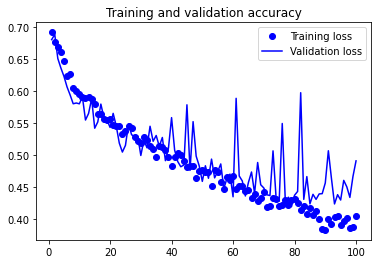

In [28]:
import matplotlib.pyplot as plt

acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc)+1)

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation accuracy')
plt.legend()

plt.show()

데이터가 적기 때문에 컨브넷을 처음부터 훈련해서 더 높은 정확도를 달성하기는 어려움

이런 상황에서 정확도를 높이기 위한 다음 단계는 사전 훈련된 모델을 사용하는 것임

In [29]:
# VGG16 합성곱 기반 층 만들기

from tensorflow.keras.applications import VGG16

conv_base = VGG16(weights='imagenet',
                  include_top=False,
                  input_shape=(150, 150, 3))

58892288/58889256 [==============================] - 0s 0us/step


- weight 모델을 초기화할 가중치 체크포인트를 지정
- include_top 네트워크의 최상위 완전 연결 분류기를 포함할지 안할지 지정함
- input_shape 네트워크에 주입할 이미지 텐서의 크기 

In [30]:
conv_base.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 150, 150, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 150, 150, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 150, 150, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 75, 75, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 75, 75, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 75, 75, 128)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 37, 37, 128)       0     

In [31]:
# 데이터 증식을 사용하지 않는 빠른 특성 추출
# 사전 훈련된 합성곱 기반 층을 사용한 특성 추출하기

import os
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator

base_dir = '/content/drive/MyDrive/datasets/cats_and_dogs_small'
train_dir = os.path.join(base_dir, 'train')
validation_dir = os.path.join(base_dir, 'validation')
test_dir = os.path.join(base_dir, 'test')

datagen = ImageDataGenerator(rescale=1./255)
batch_size = 20

def extract_features(directory, sample_count):
  features = np.zeros(shape=(sample_count, 4, 4, 512))
  labels = np.zeros(shape=(sample_count))
  generator = datagen.flow_from_directory(
      directory,
      target_size=(150, 150),
      batch_size=batch_size,
      class_mode='binary')
  i = 0
  for inputs_batch, labels_batch in generator:
    features_batch = conv_base.predict(inputs_batch)
    features[i * batch_size : (i + 1) * batch_size] = features_batch
    labels[i * batch_size : (i + 1) * batch_size] = labels_batch
    i += 1
    if i * batch_size >= sample_count:
      break
  return features, labels

train_features, train_labels = extract_features(train_dir, 2000)
validation_features, validation_labels = extract_features(validation_dir, 1000)
test_features, test_labels = extract_features(test_dir, 1000)

Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.


추출된 특성의 크기는 (samples, 4, 4, 512) 이므로 완전 연결 분류기에 주입하기 위해 (samples, 8192) 크기로 펼침

In [32]:
train_features = np.reshape(train_features, (2000, 4 * 4 * 512))
validation_features = np.reshape(validation_features, (1000, 4 * 4 * 512))
test_features = np.reshape(test_features, (1000, 4 * 4 * 512))

In [33]:
# 완전 연결 분류기를 정의하고 훈련하기

from tensorflow.keras import models
from tensorflow.keras import layers
from tensorflow.keras import optimizers

model = models.Sequential()
model.add(layers.Dense(256, activation='relu', input_dim=4*4*512))
model.add(layers.Dropout(0.5))
model.add(layers.Dense(1, activation='sigmoid'))

model.compile(optimizer=optimizers.RMSprop(lr=2e-5),
              loss='binary_crossentropy',
              metrics=['acc'])

history = model.fit(train_features, train_labels,
                    epochs=30,
                    batch_size=20,
                    validation_data=(validation_features, validation_labels))

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/optimizer_v2/optimizer_v2.py:375: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


Epoch 1/30
100/100 [==============================] - 1s 6ms/step - loss: 0.6029 - acc: 0.6655 - val_loss: 0.4315 - val_acc: 0.8390
Epoch 2/30
100/100 [==============================] - 0s 5ms/step - loss: 0.4260 - acc: 0.8125 - val_loss: 0.3666 - val_acc: 0.8460
Epoch 3/30
100/100 [==============================] - 0s 5ms/step - loss: 0.3485 - acc: 0.8490 - val_loss: 0.3172 - val_acc: 0.8770
Epoch 4/30
100/100 [==============================] - 0s 4ms/step - loss: 0.3029 - acc: 0.8765 - val_loss: 0.2959 - val_acc: 0.8880
Epoch 5/30
100/100 [==============================] - 0s 5ms/step - loss: 0.2851 - acc: 0.8830 - val_loss: 0.2877 - val_acc: 0.8860
Epoch 6/30
100/100 [==============================] - 0s 4ms/step - loss: 0.2596 - acc: 0.8945 - val_loss: 0.2698 - val_acc: 0.8970
Epoch 7/30
100/100 [==============================] - 0s 4ms/step - loss: 0.2428 - acc: 0.9035 - val_loss: 0.2758 - val_acc: 0.8850
Epoch 8/30
100/100 [==============================] - 0s 4ms/step - loss: 0.

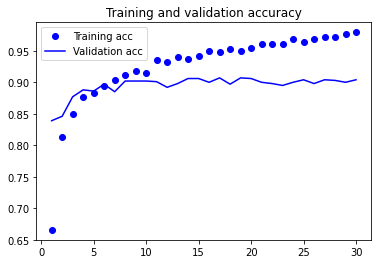

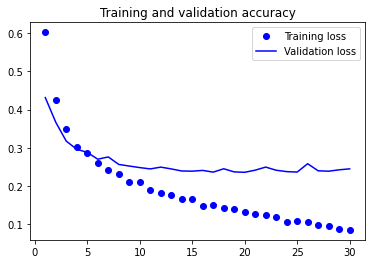

In [34]:
# 결과 그래프 그리기

import matplotlib.pyplot as plt

acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc)+1)

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation accuracy')
plt.legend()

plt.show()

In [35]:
# 데이터 증식을 사용한 특성 추출
# 합성곱 기반 층 위에 완전 연결 분류기 추가하기

from tensorflow.keras import models
from tensorflow.keras import layers

model = models.Sequential()
model.add(conv_base)
model.add(layers.Flatten())
model.add(layers.Dense(256, activation='relu'))
model.add(layers.Dense(1, activation='sigmoid'))

In [36]:
model.summary()

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Functional)           (None, 4, 4, 512)         14714688  
_________________________________________________________________
flatten_3 (Flatten)          (None, 8192)              0         
_________________________________________________________________
dense_8 (Dense)              (None, 256)               2097408   
_________________________________________________________________
dense_9 (Dense)              (None, 1)                 257       
Total params: 16,812,353
Trainable params: 16,812,353
Non-trainable params: 0
_________________________________________________________________


In [37]:
print('conv_base를 동결하기 전 훈련되는 가중치의 수 : ', 
      len(model.trainable_weights))

conv_base를 동결하기 전 훈련되는 가중치의 수 :  30


In [38]:
# trainable 속성을 False로 설정하여 네트워크를 동결할 수 있음
conv_base.trainable = False
print('conv_base를 동결한 후 훈련되는 가중치의 수 : ',
      len(model.trainable_weights))

conv_base를 동결한 후 훈련되는 가중치의 수 :  4


In [39]:
# 동결된 합성곱 기반 층과 함꼐 모델을 엔드-투-엔드로 훈련하기
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import optimizers

train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest')

test_dategen = ImageDataGenerator(rescale=1./255)

train_datagen = train_datagen.flow_from_directory(
    train_dir,
    target_size=(150, 150),
    batch_size=20,
    class_mode='binary')

model.compile(loss='binary_crossentropy',
              optimizer=optimizers.RMSprop(lr=2e-5),
              metrics=['acc'])

history = model.fit_generator(
    train_generator,
    steps_per_epoch=100,
    epochs=30,
    validation_data=validation_generator,
    validation_steps=50,
    verbose=2)

Found 2000 images belonging to 2 classes.


/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/optimizer_v2/optimizer_v2.py:375: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")
/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1940: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/30
100/100 - 22s - loss: 0.5766 - acc: 0.7025 - val_loss: 0.4380 - val_acc: 0.8150
Epoch 2/30
100/100 - 20s - loss: 0.4696 - acc: 0.7890 - val_loss: 0.3724 - val_acc: 0.8410
Epoch 3/30
100/100 - 22s - loss: 0.4208 - acc: 0.8095 - val_loss: 0.3263 - val_acc: 0.8640
Epoch 4/30
100/100 - 22s - loss: 0.4061 - acc: 0.8165 - val_loss: 0.3101 - val_acc: 0.8760
Epoch 5/30
100/100 - 22s - loss: 0.3901 - acc: 0.8305 - val_loss: 0.2952 - val_acc: 0.8790
Epoch 6/30
100/100 - 20s - loss: 0.3704 - acc: 0.8450 - val_loss: 0.2828 - val_acc: 0.8800
Epoch 7/30
100/100 - 20s - loss: 0.3641 - acc: 0.8335 - val_loss: 0.2773 - val_acc: 0.8850
Epoch 8/30
100/100 - 22s - loss: 0.3451 - acc: 0.8515 - val_loss: 0.2701 - val_acc: 0.8850
Epoch 9/30
100/100 - 20s - loss: 0.3383 - acc: 0.8565 - val_loss: 0.2648 - val_acc: 0.8860
Epoch 10/30
100/100 - 20s - loss: 0.3340 - acc: 0.8520 - val_loss: 0.2644 - val_acc: 0.8850
Epoch 11/30
100/100 - 22s - loss: 0.3267 - acc: 0.8555 - val_loss: 0.2556 - val_acc: 0.89

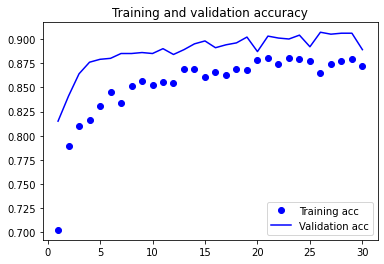

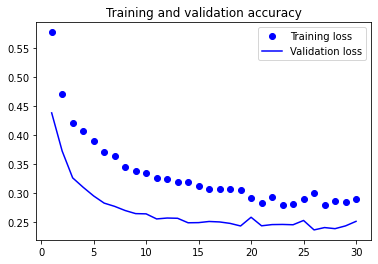

In [40]:
# 결과 그래프 그리기

import matplotlib.pyplot as plt

acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc)+1)

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation accuracy')
plt.legend()

plt.show()

미세 조정은 특성 추출에 사용했던 동결 모델의 상위 층 몇 개를 동결에서 해제하고 모델에 새로 추가한 층과 함께 훈련하는 것

In [41]:
conv_base.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 150, 150, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 150, 150, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 150, 150, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 75, 75, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 75, 75, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 75, 75, 128)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 37, 37, 128)       0     

In [42]:
# 특성 층까지 모든 층 동결하기

conv_base.trainable = True

set_trainable = False
for layer in conv_base.layers:
  if layer.name == 'block5_conv1':
    set_trainable = True
  if set_trainable:
    layer.trainble = True
  else:
    layer.trainable = False

In [44]:
# 모델 미세 조정하기

model.compile(loss='binary_crossentropy',
              optimizer=optimizers.RMSprop(lr=1e-5),
              metrics=['accuracy'])

history = model.fit_generator(
      train_generator,
      steps_per_epoch=100,
      epochs=100,
      validation_data=validation_generator,
      validation_steps=50)

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/optimizer_v2/optimizer_v2.py:375: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")
/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1940: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/100
100/100 [==============================] - 23s 214ms/step - loss: 0.2770 - accuracy: 0.8825 - val_loss: 0.2417 - val_accuracy: 0.9060
Epoch 2/100
100/100 [==============================] - 23s 229ms/step - loss: 0.2706 - accuracy: 0.8855 - val_loss: 0.2140 - val_accuracy: 0.9200
Epoch 3/100
100/100 [==============================] - 23s 227ms/step - loss: 0.2446 - accuracy: 0.8980 - val_loss: 0.1986 - val_accuracy: 0.9230
Epoch 4/100
100/100 [==============================] - 21s 215ms/step - loss: 0.2113 - accuracy: 0.9130 - val_loss: 0.1975 - val_accuracy: 0.9230
Epoch 5/100
100/100 [==============================] - 23s 229ms/step - loss: 0.2193 - accuracy: 0.9115 - val_loss: 0.1877 - val_accuracy: 0.9260
Epoch 6/100
100/100 [==============================] - 23s 228ms/step - loss: 0.1973 - accuracy: 0.9195 - val_loss: 0.2240 - val_accuracy: 0.9150
Epoch 7/100
100/100 [==============================] - 23s 232ms/step - loss: 0.1723 - accuracy: 0.9330 - val_loss: 0.2481 -

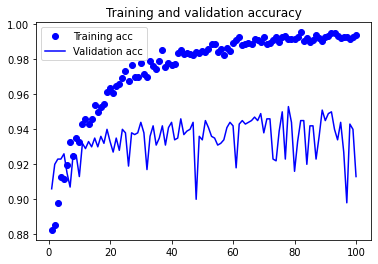

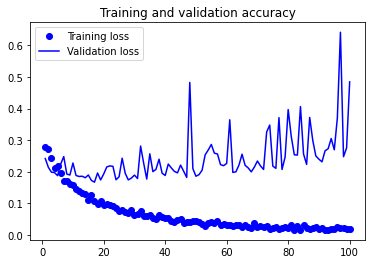

In [47]:
# 결과 그래프 그리기

import matplotlib.pyplot as plt

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc)+1)

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation accuracy')
plt.legend()

plt.show()

그래프가 불규칙하게 보임 -> 지수이동평균(EMA)로 정확도와 손실 값을 부드럽게 표현할 수 있음

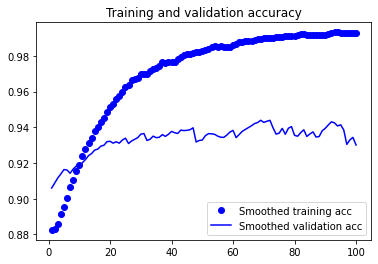

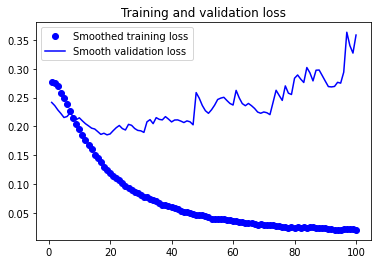

In [48]:
# 부드러운 그래프 그리기
def smooth_curve(points, factor=0.8):
  smoothed_points =[]
  for point in points:
    if smoothed_points:
      previous = smoothed_points[-1]
      smoothed_points.append(previous * factor + point * (1 - factor))
    else:
      smoothed_points.append(point)
  return smoothed_points

plt.plot(epochs,
         smooth_curve(acc), 'bo', label='Smoothed training acc')
plt.plot(epochs,
         smooth_curve(val_acc), 'b', label='Smoothed validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs,
         smooth_curve(loss), 'bo', label='Smoothed training loss')
plt.plot(epochs,
         smooth_curve(val_loss), 'b', label='Smooth validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [49]:
# 테스트 데이터에서 위 모델을 평가

test_generatoe = test_datagen.flow_from_directory(
    test_dir,
    target_size=(150, 150),
    batch_size=20,
    class_mode='binary')

test_loss, test_acc = model.evaluate_generator(test_generator, steps=50)
print('test acc:', test_acc)

Found 1000 images belonging to 2 classes.


NameError: ignored

## 컨브넷 중간층의 출력을 시각화하기(중간층에 있는 활성화 시각화하기)
어떤 입력이 주어졌을 떄 네트워크에 있는 여러 합성곱과 풀링 층이 출력하는 특성 맵을 그리는 것

네트워크에 의해 학습된 필터들이 어떻게 입력을 분해하는지 보여줌

In [50]:
from tensorflow.keras.models import load_model
model = load_model('cats_and_dogs_small_2.h5')
model.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_9 (Conv2D)            (None, 148, 148, 32)      896       
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 74, 74, 32)        0         
_________________________________________________________________
conv2d_10 (Conv2D)           (None, 72, 72, 64)        18496     
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 36, 36, 64)        0         
_________________________________________________________________
conv2d_11 (Conv2D)           (None, 34, 34, 128)       73856     
_________________________________________________________________
max_pooling2d_7 (MaxPooling2 (None, 17, 17, 128)       0         
_________________________________________________________________
conv2d_12 (Conv2D)           (None, 15, 15, 128)      

In [51]:
# 개별 이미지 전처리하기

img_path = '/content/drive/MyDrive/datasets/cats_and_dogs_small/test/cats/cat.1700.jpg'

from tensorflow.keras.preprocessing import image
import numpy as np

img = image.load_img(img_path, target_size=(150, 150))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0) # 이미지를 4D 텐서로 변경
img_tensor /= 255.

print(img_tensor.shape)

(1, 150, 150, 3)


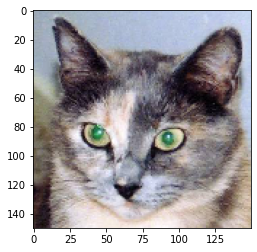

In [52]:
# 테스트 사진 출력하기

import matplotlib.pyplot as plt

plt.imshow(img_tensor[0])
plt.show()

In [53]:
# 입력 텐서와 출력 텐서의 리스트로 모델 인스턴스 만들기

from tensorflow.keras import models

layer_outputs = [layer.output for layer in model.layers[:8]] # 상위 8개 층의 출력을 추출
activation_model = models.Model(inputs=model.input, outputs=layer_outputs)

In [54]:
# 예측 모드로 모델 실행하기

activations = activation_model.predict(img_tensor)

In [70]:
first_layer_activation = activations[0]
print(first_layer_activation.shape)

(1, 148, 148, 32)


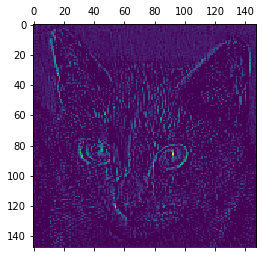

In [71]:
# 20번째 채널 시각화하기
import matplotlib.pyplot as plt

plt.matshow(first_layer_activation[0, :, :, 19], cmap='viridis')

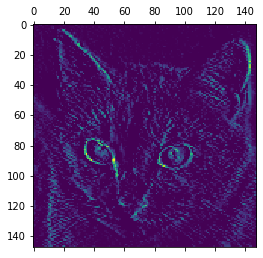

In [72]:
# 16번쨰 채널 시각화하기
plt.matshow(first_layer_activation[0, :, :, 15], cmap='viridis')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:30: RuntimeWarning: invalid value encountered in true_divide


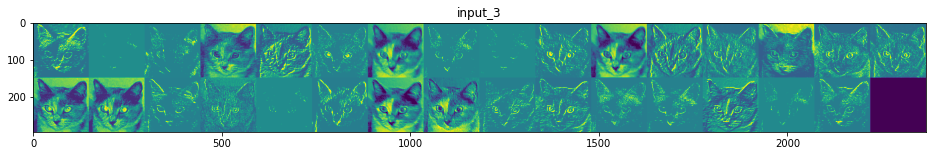

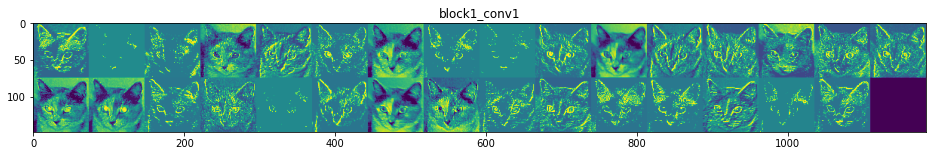

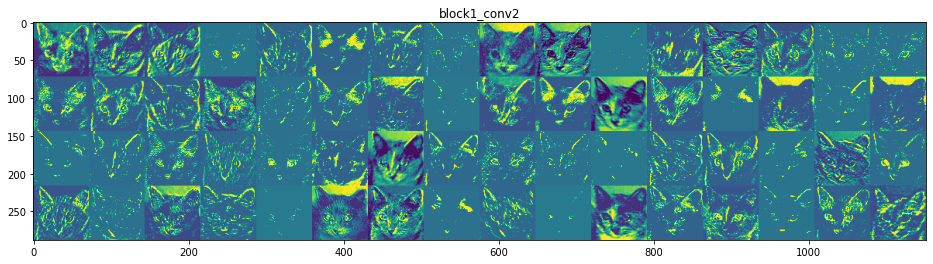

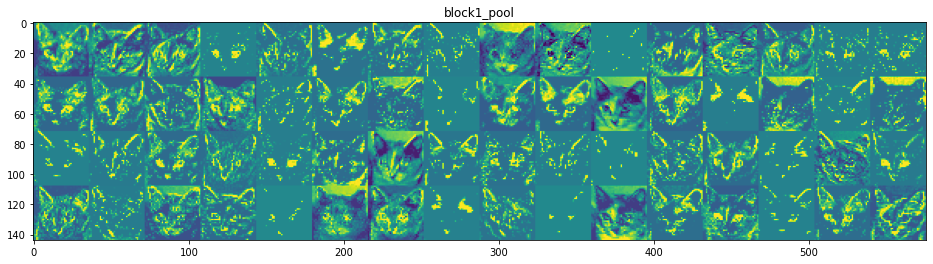

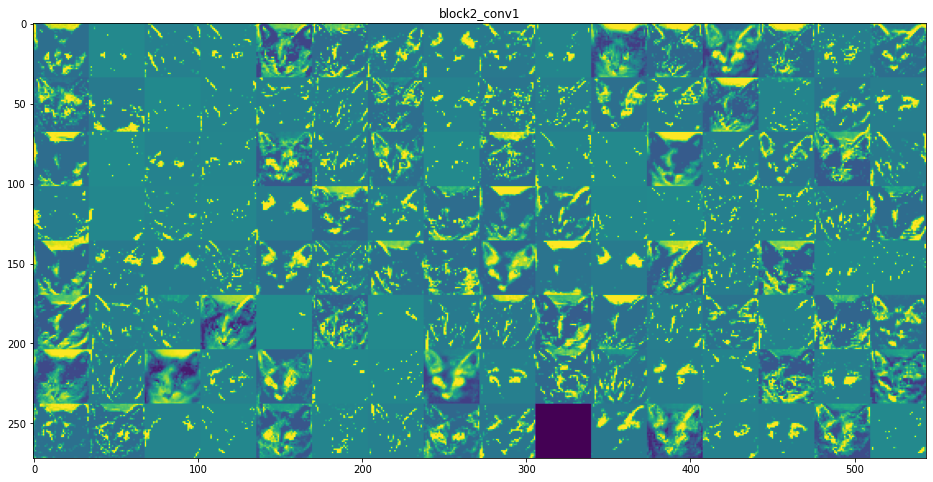

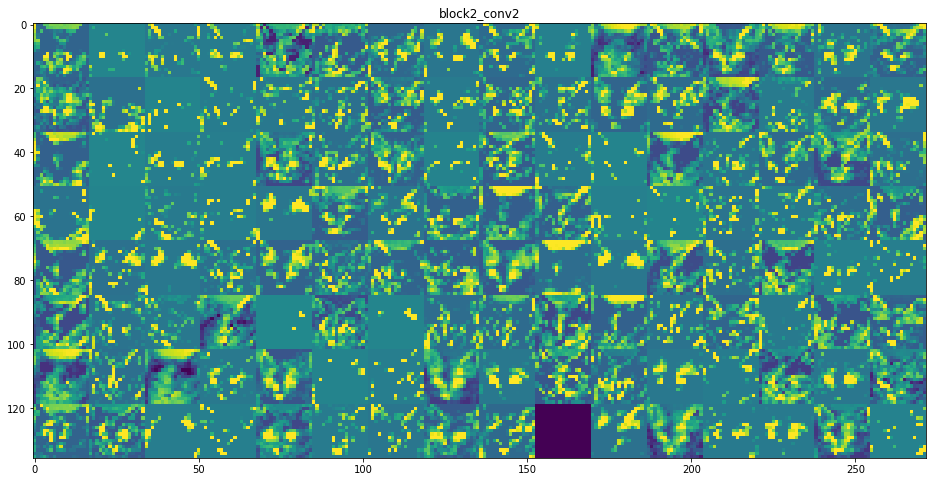

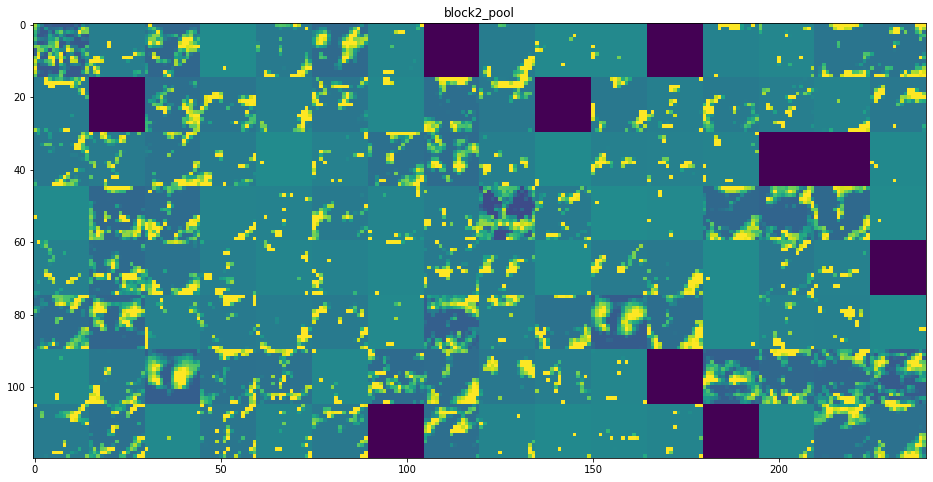

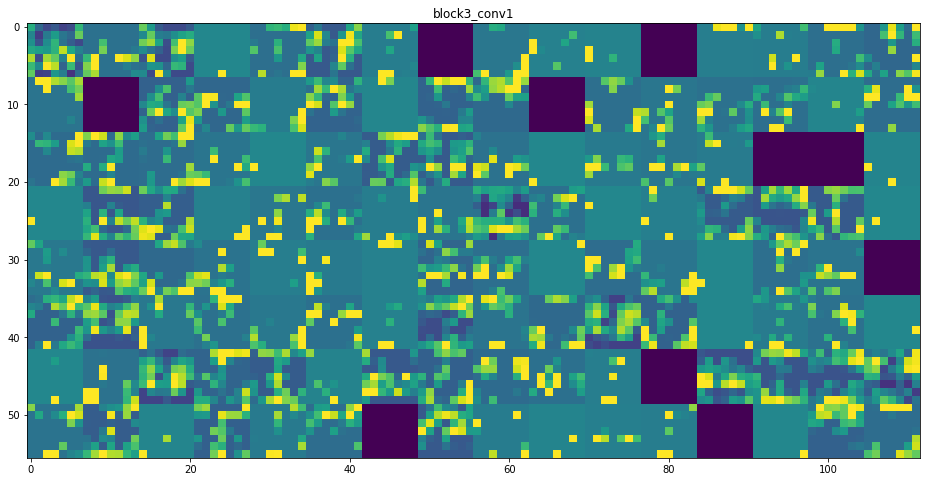

In [91]:
# 중간층의 모든 활성화에 있는 채널 시각화하기

# 층의 이름을 그래프 제목으로 사용합니다
layer_names = []
for layer in model.layers[:8]:
    layer_names.append(layer.name)

images_per_row = 16

# 특성 맵을 그립니다
for layer_name, layer_activation in zip(layer_names, activations):
    # 특성 맵에 있는 특성의 수
    n_features = layer_activation.shape[-1]

    # 특성 맵의 크기는 (1, size, size, n_features)입니다
    size = layer_activation.shape[1]

    # 활성화 채널을 위한 그리드 크기를 구합니다
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    # 각 활성화를 하나의 큰 그리드에 채웁니다
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            # 그래프로 나타내기 좋게 특성을 처리합니다
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image

    # 그리드를 출력합니다
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')

plt.show()

## 컨브넷 필터 시각화하기
컨브넷의 필터가 찾으려는 시각적인 패턴과 개념이 무엇인지 상세하게 이해하는데 도움됨

빈 입력 이미지에서 시작해서 특정 필터의 응답을 최대화하기 위해 컨브넷 입력 이미지에 경사 상승법을 적용함 -> 선택된 필터가 최대로 응답하는 이미지가 됨

In [99]:
# 필터 시각화를 위한 손실 텐서 정의하기
from tensorflow.keras.applications import VGG16
from tensorflow.keras import backend as K

model = VGG16(weights='imagenet',
              include_top=False)

layer_name = 'block3_conv1'
filter_index = 0

layer_output = model.get_layer(layer_name).output
loss = K.mean(layer_output[:, :, :, filter_index])

In [101]:
# 입력에 대한 손실의 그래디언트 구하기
from tensorflow.keras.applications import VGG16
from tensorflow.keras import backend as K
import tensorflow as tf
tf.compat.v1.disable_eager_execution()


model = VGG16(weights='imagenet',
              include_top=False)

layer_name = 'block3_conv1'
filter_index = 0

layer_output = model.get_layer(layer_name).output
loss = K.mean(layer_output[:, :, :, filter_index])

grads = K.gradients(loss, model.input)[0]

In [102]:
# 그래디언트 정규화하기
grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)

In [103]:
# 입력 값에 대한 넘파이 출력 값 추출하기
iterate = K.function([model.input], [loss, grads])

import numpy as np
loss_value, grads_value = iterate([np.zeros((1, 150, 150, 3))])

In [104]:
# 확률적 경사 상승법을 사용한 손실 최대화하기
input_img_data = np.random.random((1, 150, 150, 3)) * 20 + 128.

# 경사 상승법 40회 실행
step = 1.
for i in range(40):
  loss_value, grads_value = iterate([input_img_data])
  input_img_data += grads_value * step # 손실을 최대화하는 방향으로 입력 이미지를 수정

In [118]:
# 텐서를 이미지 형태로 변환하기 위한 유틸리티 함수
def deprocess_image(x):
  # 텐서의 평균이 0, 표준편차가 0.1이 되도록 정규화함
  x -= x.mean()
  x /= (x.std() + 1e-5)
  x *= 0.1

  # [0,1]로 클리핑함
  x += 0.5
  x = np.clip(x, 0, 1)

  # RGB 배열로 변환
  x *= 255
  x = np.clip(x, 0, 255).astype('uint8')
  return x

In [122]:
# 필터 시각화 이미지를 만드는 함수
def generate_pattern(layer_name, filter_index, size=150):
  layer_output = model.get_layer(layer_name).output
  loss = K.mean(layer_output[:, :, :, filter_index])

  grads = K.gradients(loss, model.input)[0]

  grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)

  iterate = K.function([model.input], [loss, grads])
  input_img_data = np.random.random((1, size, size, 3)) * 20 + 128.

  setp = 1.
  for i in range(40):
    loss_value, grads_value = iterate([input_img_data])
    input_img_data += grads_value * step

  img = input_img_data[0]
  return deprocess_image(img)

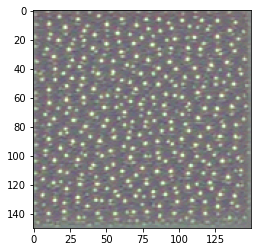

In [123]:
plt.imshow(generate_pattern('block3_conv1', 0))
plt.show()

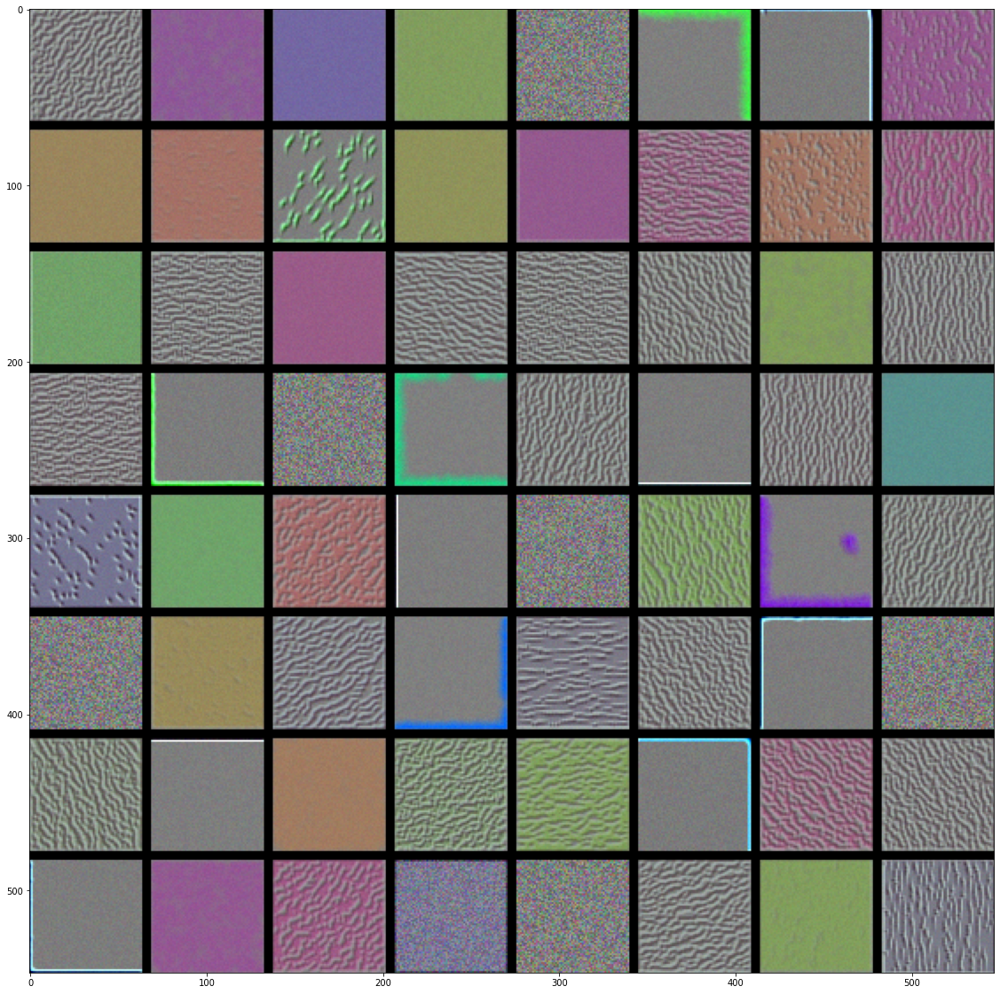

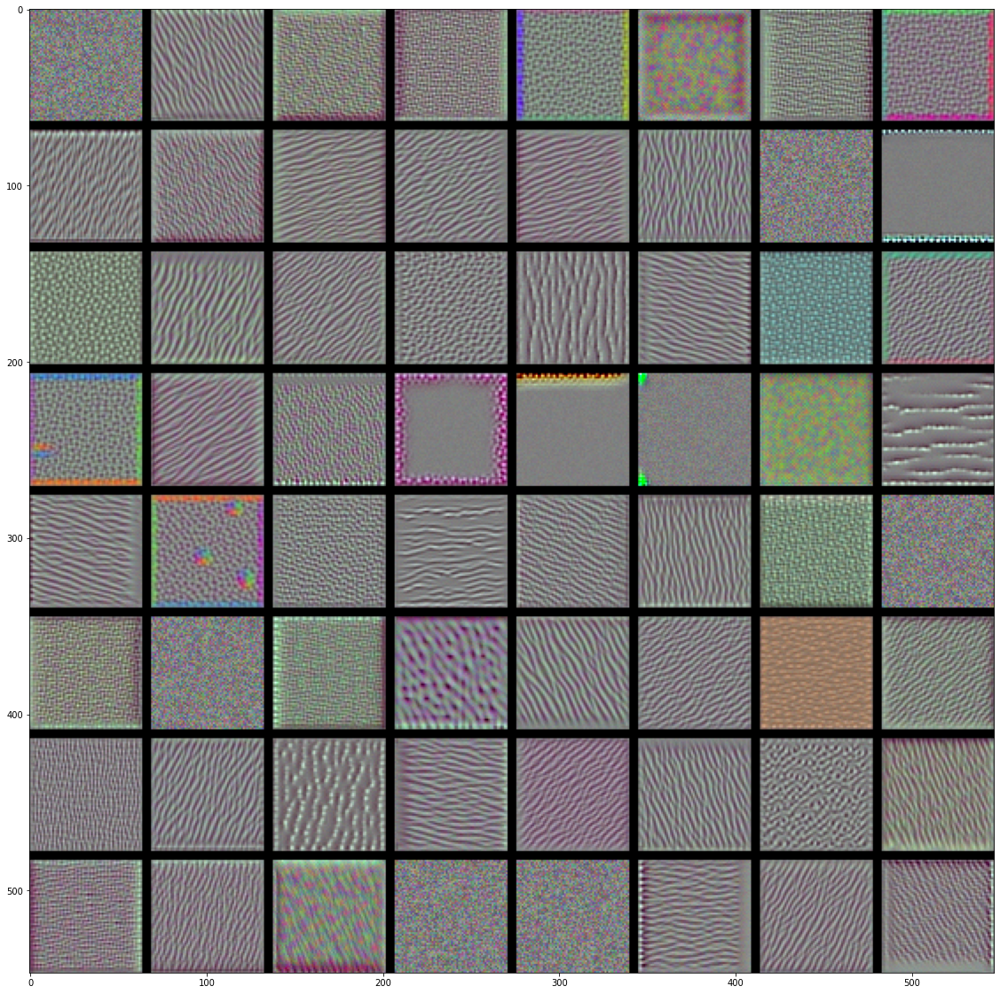

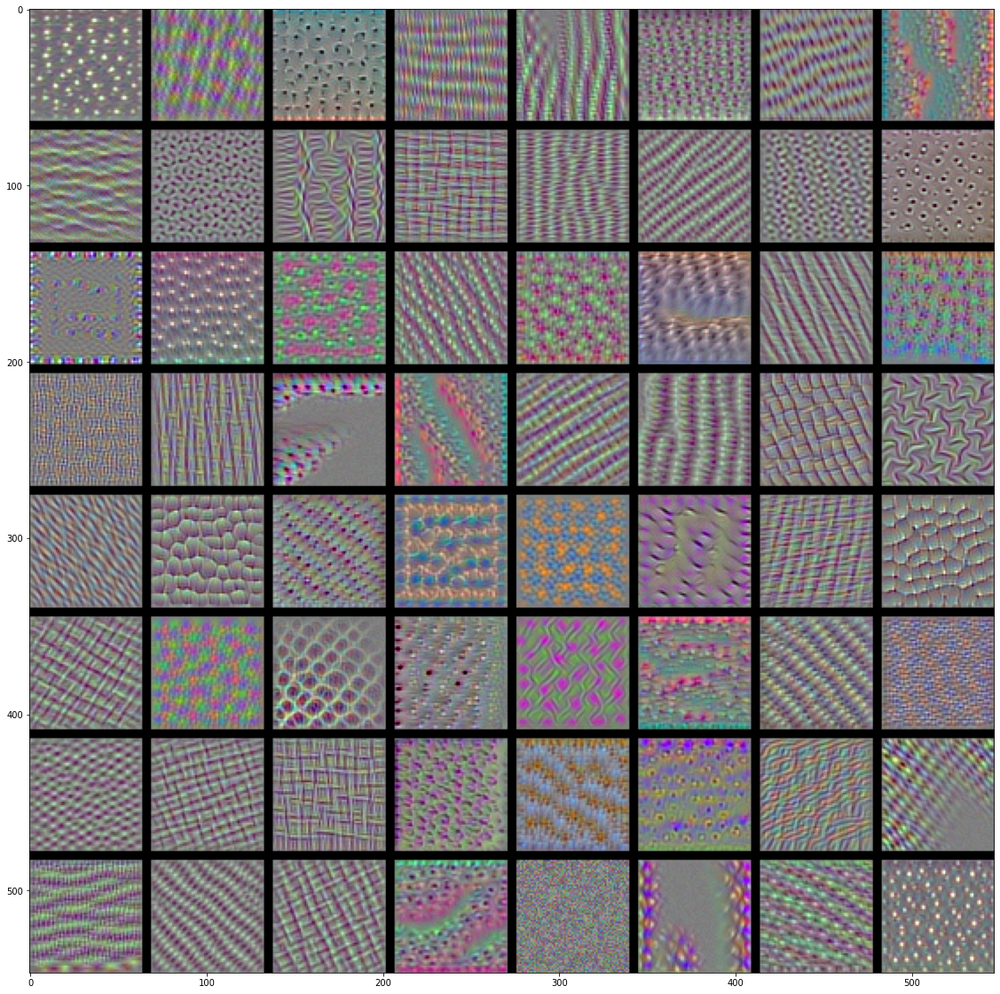

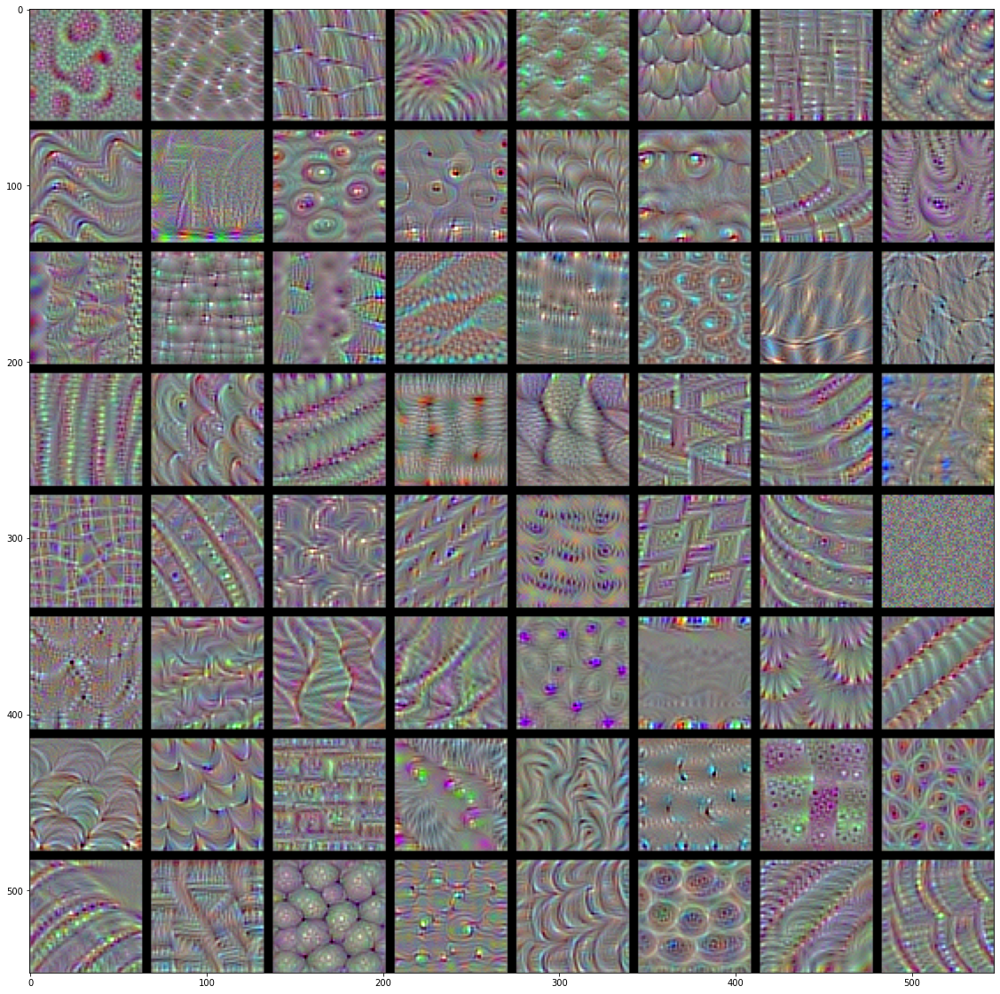

In [124]:
# 층에 있는 각 필터에 반응하는 패턴 생성하기
for layer_name in ['block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1']:
    size = 64
    margin = 5

    # 결과를 담을 빈 (검은) 이미지
    results = np.zeros((8 * size + 7 * margin, 8 * size + 7 * margin, 3), dtype='uint8')

    for i in range(8):  # results 그리드의 행을 반복합니다
        for j in range(8):  # results 그리드의 열을 반복합니다
            # layer_name에 있는 i + (j * 8)번째 필터에 대한 패턴 생성합니다
            filter_img = generate_pattern(layer_name, i + (j * 8), size=size)

            # results 그리드의 (i, j) 번째 위치에 저장합니다
            horizontal_start = i * size + i * margin
            horizontal_end = horizontal_start + size
            vertical_start = j * size + j * margin
            vertical_end = vertical_start + size
            results[horizontal_start: horizontal_end, vertical_start: vertical_end, :] = filter_img

    # results 그리드를 그립니다
    plt.figure(figsize=(20, 20))
    plt.imshow(results)
    plt.show()

## 클래스 활성화의 히트맵 시각화하기
이미지의 어느 부분이 주어진 클래스에 속하는 데 기여했는지 이해하고 이미지에서 객체 위치를 추정하는데 도움 됨



In [125]:
# 사전 훈련된 가중치로 VGG16 네트워크 로드하기
from tensorflow.keras.applications.vgg16 import VGG16

model = VGG16(weights='imagenet')

In [126]:
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.vgg16 import preprocess_input, decode_predictions
import numpy as np

img_path = '/content/drive/MyDrive/datasets/creative_commons_elephant.jpg'

img = image.load_img(img_path, target_size=(224, 224))

x = image.img_to_array(img)

x = np.expand_dims(x, axis=0)

x = preprocess_input(x)

In [127]:
preds = model.predict(x)
print('Predicted:', decode_predictions(preds, top=3)[0])


/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:2426: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '


Predicted: [('n02504458', 'African_elephant', 0.90942174), ('n01871265', 'tusker', 0.086182125), ('n02504013', 'Indian_elephant', 0.004354569)]


In [128]:
np.argmax(preds[0])

386

In [129]:
# Grad-CAM 알고리즘 설정하기
african_elephant_output = model.output[:, 386]

last_conv_layer = model.get_layer('block5_conv3')

grads = K.gradients(african_elephant_output, last_conv_layer.output)[0]

pooled_grads = K.mean(grads, axis=(0, 1, 2))

iterate = K.function([model.input], 
                     [pooled_grads, last_conv_layer.output[0]])

pooled_grads_value, conv_layer_output_value = iterate([x])

for i in range(512):
  conv_layer_output_value[:, :, i] *= pooled_grads_value[i]

heatmap = np.mean(conv_layer_output_value, axis = -1)

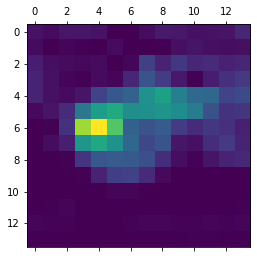

In [130]:
# 히트맵 후처리하기
heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)
plt.matshow(heatmap)

In [132]:
# 원본 이미지에 히트맵 덧붙이기
import cv2

img = cv2.imread(img_path)

heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

heatmap = np.uint8(255 * heatmap)

heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

superimposed_img = heatmap * 0.4 + img # 0.4는 히트맵의 강도

cv2.imwrite('/content/drive/MyDrive/datasets/creative_commons_elephant.jpg', superimposed_img)

True